# Remastering Star Wars using Deep Learning

{% include youtubePlayer.html id="2WS6s5bGdoA?autoplay=1&mute=1&loop=1&playlist=2WS6s5bGdoA" %}

A New Hope for the Deleted Scenes.

I’m a huge Star Wars fan. And like a lot of Star Wars fans I’ve been getting into [Star Wars: The Clone Wars](https://www.imdb.com/title/tt0458290/) on Cartoon Network and Disney+. It’s a phenomenal show. 

But I'm always annoyed by the drop in video quality when I watch the older stuff. For example, here are the deleted scenes from  Star Wars: Episode IV: A New Hope (1977). This was the very first Star Wars to be created.

{% include youtubePlayer.html id="f00IkrWvur4?start=159" %}

What are those weird black specs that keep popping up? They really ruin the experience. Small wonder why these are the *deleted* scenes. 

Apparently those weird specs are called [cue marks](https://en.wikipedia.org/wiki/Cue_mark). They're marks that come from scratches on film. Star Wars is a fantastic series, but it’s also fantastically *old*. 

Deep Learning has recently been used for video restoration. The results have been very promising. [Deoldify](https://github.com/jantic/DeOldify) for example, allows users to colorize old videos and images. [NVIDIA's Noise2Noise model](https://www.youtube.com/watch?v=P0fMwA3X5KI) allows people to restore old images to their former glory. 

But so far there's nothing I know of that can specifically remove 'cue marks' and grainy spots from old film. So let's build it!


In [ ]:
#hide
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
#hide
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *
from torchvision.models import vgg16_bn

In [ ]:
#hide
def show_short_video(file):

  output_file = os.path.basename(file).split('.')[0]+'_short.'+os.path.basename(file).split('.')[1]
  # show_video('seinfeld_short.mp4')

  !ffmpeg -loglevel quiet -y -ss 00:00:00 -i $file -c copy -t 00:00:10.0 $output_file

  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(output_file,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

# Creating the Dataset

Creating the dataset was tricky - but still doable. Here's what I did. I downloaded high quality videos into from youtube. Then I ruined them. I added black specs and reduced the resolution of the video. [Ffmpeg](https://ffmpeg.org/) was very useful in doing this. 

First we'll download the video.

In [ ]:
#hide_output
!pip install youtube-dl

     |████████████████████████████████| 1.8MB 2.7MB/s 


In [ ]:
#hide_output
!rm seinfeld.mp4

!youtube-dl --format best -o seinfeld.mp4 https://www.youtube.com/watch?v=nEAO60ON7yo # seinfeld

# !youtube-dl --format best -o seinfeld.mp4 https://www.youtube.com/watch?v=9emW_j-hBeY # star wars
# !youtube-dl --format best -o seinfeld.mp4 https://www.youtube.com/watch?v=rLvpsZkLmF8 # star wars


# !youtube-dl --format 313 -o seinfeld1.mp4 https://www.youtube.com/watch?v=YVbeA9ZD6-c # 4k video
# !ffmpeg -ss 00:00:00 -i seinfeld1.mp4 -c copy -t 00:05:00.0 seinfeld.mp4
# !rm seinfeld1.mp4

rm: cannot remove 'seinfeld.mp4': No such file or directory
[youtube] nEAO60ON7yo: Downloading webpage
[download] Destination: seinfeld.mp4
[download] 100% of 28.06MiB in 00:02


In [ ]:
#hide
# !cp /content/drive/"My Drive"/video_restorer/seinfeld.mp4 /content/
# !cp /content/drive/"My Drive"/video_restorer/output_test.mp4 /content/

In [ ]:
#hide
!rm -rf seinfeld
!mkdir seinfeld
!mkdir seinfeld/images

In [ ]:
#hide
path = Path('seinfeld')
path_hr = path/'images'
path_lr = path/'small-96'
path_mr = path/'small-256'

In [ ]:
#hide
il = ImageList.from_folder(path_hr)
il.items

array([], dtype=object)

In [ ]:
#hide
!rm -Rf build

In [ ]:
%%shell

# download grain video
rm -Rf build
YT_GRAIN_OVERLAY="https://www.youtube.com/watch?v=J_MZb7qTenE"
mkdir -p build
youtube-dl "$YT_GRAIN_OVERLAY" -f mp4 --output "build/grain.mp4"

[youtube] J_MZb7qTenE: Downloading webpage
[youtube] J_MZb7qTenE: Downloading MPD manifest
[download] Destination: build/grain.mp4
[download] 100% of 1.41MiB in 00:00


In [ ]:
#hide
%%shell

# extend grain video to entire length of seinfeld video

rm 1.mp3
rm "build/grain_extended.mp4"
ffmpeg -loglevel warning -y -i "seinfeld.mp4" 1.mp3
ffmpeg -loglevel warning -stream_loop -1 -i "build/grain.mp4" -c copy -v 0 -f nut - | ffmpeg -loglevel warning -thread_queue_size 10K -i - -i 1.mp3 -c copy -map 0:v -map 1:a -shortest -y "build/grain_extended.mp4"

In [ ]:
#hide
%%shell

ffmpeg -stream_loop 6 -i "build/grain.mp4" -c copy "build/grain_extended.mp4"

In [ ]:
#hide
%%shell

# invert colors
ffmpeg -loglevel quiet -y -i "build/grain_extended.mp4" -vf negate 'color_inverted.mp4'

Now we have two videos. One in perfect quality and another in shitty quality.


In [ ]:
%%shell 
# -filter_complex "[1:v][0:v]blend=all_mode='hardlight'" \
# overlay videos

ffmpeg \
    -y \
    -loglevel quiet \
    -i "seinfeld.mp4" \
    -i "color_inverted.mp4" \
    -filter_complex "[1:v][0:v]blend=all_mode='softlight':all_opacity=1" \
    "output_test.mp4"

In [ ]:
show_short_video('output_test.mp4')

In [ ]:
show_short_video('seinfeld.mp4')

In [ ]:
#hide
show_short_video('color_inverted.mp4')

# Extract Frames

Now we'll extract frames from each video. Initially I adopted a naive approach for doing this. Where I would do through the video in python and scrape each frame individually. But that took too long. 

We can use multi-processing here to really speed things up. This was adapted from [Hayden Faulker's](https://gist.github.com/HaydenFaulkner/54318fd3e9b9bdb66c5440c44e4e08b8#file-video_to_frames-py) script.

In [ ]:
#hide
import cv2

%cd /content
!rm -Rf $path_lr
!rm -Rf $path_mr
!rm -Rf $path_hr
path_hr.mkdir(parents=True, exist_ok=True)
path_lr.mkdir(parents=True, exist_ok=True)
path_hr.mkdir(parents=True, exist_ok=True)

crappy = 'output_test.mp4'
clean = 'seinfeld.mp4'

clean, crappy

/content


('clean.mp4', 'crappy.mp4')

## equal fps

In [ ]:
#hide
%%time
import math
# Drop frame rate
def equal_fps(clean,crappy):

  cap = cv2.VideoCapture(clean)
  clean_fps = int(cap.get(cv2.CAP_PROP_FPS))
  print(clean_fps)

  %cd /content
  # !ffmpeg -y -i $crappy -c copy -f h264 seeing_noaudio.h264
  # !ffmpeg -y -r $clean_fps -i seeing_noaudio.h264 -c copy 'crappy.mp4'
  # !rm seeing_noaudio.h264
  !ffmpeg -loglevel quiet -y -i $crappy -filter:v fps=fps=$clean_fps 'crappy.mp4'

  # !ffmpeg -y -i $clean -c copy -f h264 seeing_noaudio.h264
  # !ffmpeg -y -r $clean_fps -i seeing_noaudio.h264 -c copy 'clean.mp4'
  !ffmpeg -loglevel quiet -y -i $clean -filter:v fps=fps=$clean_fps 'clean.mp4'

  return 'crappy.mp4', 'clean.mp4'

crappy, clean = equal_fps(clean,crappy)
crappy, clean

24
/content
CPU times: user 1.57 s, sys: 325 ms, total: 1.89 s
Wall time: 12min 46s


In [ ]:
#hide
def get_fps(file):
  cap = cv2.VideoCapture(file)
  fps = cap.get(cv2.CAP_PROP_FPS)
  return fps

print(get_fps(crappy))
print(get_fps(clean))

24.0
24.0


In [ ]:
#hide
show_short_video(clean)

In [ ]:
#hide
show_short_video(crappy)

In [ ]:
# from https://gist.github.com/HaydenFaulkner/54318fd3e9b9bdb66c5440c44e4e08b8#file-video_to_frames-py

from concurrent.futures import ProcessPoolExecutor, as_completed
import cv2
import multiprocessing
import os
import sys


def print_progress(iteration, total, prefix='', suffix='', decimals=3, bar_length=100):
    """
    Call in a loop to create standard out progress bar

    :param iteration: current iteration
    :param total: total iterations
    :param prefix: prefix string
    :param suffix: suffix string
    :param decimals: positive number of decimals in percent complete
    :param bar_length: character length of bar
    :return: None
    """

    format_str = "{0:." + str(decimals) + "f}"  # format the % done number string
    percents = format_str.format(100 * (iteration / float(total)))  # calculate the % done
    filled_length = int(round(bar_length * iteration / float(total)))  # calculate the filled bar length
    bar = '#' * filled_length + '-' * (bar_length - filled_length)  # generate the bar string
    sys.stdout.write('\r%s |%s| %s%s %s' % (prefix, bar, percents, '%', suffix)),  # write out the bar
    sys.stdout.flush()  # flush to stdout


def extract_frames(video_path, frames_dir, overwrite=False, start=-1, end=-1, every=1):
    """
    Extract frames from a video using OpenCVs VideoCapture

    :param video_path: path of the video
    :param frames_dir: the directory to save the frames
    :param overwrite: to overwrite frames that already exist?
    :param start: start frame
    :param end: end frame
    :param every: frame spacing
    :return: count of images saved
    """

    video_path = os.path.normpath(video_path)  # make the paths OS (Windows) compatible
    frames_dir = os.path.normpath(frames_dir)  # make the paths OS (Windows) compatible

    video_dir, video_filename = os.path.split(video_path)  # get the video path and filename from the path

    assert os.path.exists(video_path)  # assert the video file exists

    capture = cv2.VideoCapture(video_path)  # open the video using OpenCV

    if start < 0:  # if start isn't specified lets assume 0
        start = 0
    if end < 0:  # if end isn't specified assume the end of the video
        end = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))

    capture.set(1, start)  # set the starting frame of the capture
    frame = start  # keep track of which frame we are up to, starting from start
    while_safety = 0  # a safety counter to ensure we don't enter an infinite while loop (hopefully we won't need it)
    saved_count = 0  # a count of how many frames we have saved

    while frame < end:  # lets loop through the frames until the end

        _, image = capture.read()  # read an image from the capture

        if while_safety > 500:  # break the while if our safety maxs out at 500
            break

        # sometimes OpenCV reads None's during a video, in which case we want to just skip
        if image is None:  # if we get a bad return flag or the image we read is None, lets not save
            while_safety += 1  # add 1 to our while safety, since we skip before incrementing our frame variable
            continue  # skip

        if frame % every == 0:  # if this is a frame we want to write out based on the 'every' argument
            while_safety = 0  # reset the safety count
            save_path = os.path.join(frames_dir, "{:010d}.jpg".format(frame))  # create the save path
            if not os.path.exists(save_path) or overwrite:  # if it doesn't exist or we want to overwrite anyways
                cv2.imwrite(save_path, image)  # save the extracted image
                saved_count += 1  # increment our counter by one

        frame += 1  # increment our frame count

    capture.release()  # after the while has finished close the capture

    return saved_count  # and return the count of the images we saved


def video_to_frames(video_path, frames_dir, overwrite=False, every=1, chunk_size=1000):
    """
    Extracts the frames from a video using multiprocessing

    :param video_path: path to the video
    :param frames_dir: directory to save the frames
    :param overwrite: overwrite frames if they exist?
    :param every: extract every this many frames
    :param chunk_size: how many frames to split into chunks (one chunk per cpu core process)
    :return: path to the directory where the frames were saved, or None if fails
    """

    video_path = os.path.normpath(video_path)  # make the paths OS (Windows) compatible
    frames_dir = os.path.normpath(frames_dir)  # make the paths OS (Windows) compatible

    video_dir, video_filename = os.path.split(video_path)  # get the video path and filename from the path

    # make directory to save frames, its a sub dir in the frames_dir with the video name
    # os.makedirs(os.path.join(frames_dir, video_filename), exist_ok=True)

    capture = cv2.VideoCapture(video_path)  # load the video
    total = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))  # get its total frame count
    capture.release()  # release the capture straight away

    if total < 1:  # if video has no frames, might be and opencv error
        print("Video has no frames. Check your OpenCV + ffmpeg installation, can't read videos!!!\n"
              "You may need to install OpenCV by source not pip")
        return None  # return None

    frame_chunks = [[i, i+chunk_size] for i in range(0, total, chunk_size)]  # split the frames into chunk lists
    frame_chunks[-1][-1] = min(frame_chunks[-1][-1], total-1)  # make sure last chunk has correct end frame

    prefix_str = "Extracting frames from {}".format(video_filename)  # a prefix string to be printed in progress bar

    # execute across multiple cpu cores to speed up processing, get the count automatically
    with ProcessPoolExecutor(max_workers=multiprocessing.cpu_count()) as executor:

        futures = [executor.submit(extract_frames, video_path, frames_dir, overwrite, f[0], f[1], every)
                   for f in frame_chunks]  # submit the processes: extract_frames(...)

        for i, f in enumerate(as_completed(futures)):  # as each process completes
            print_progress(i, len(frame_chunks)-1, prefix=prefix_str, suffix='Complete')  # print it's progress

    return os.path.join(frames_dir, video_filename)  # when done return the directory containing the frames


In [ ]:
%cd /content
video_to_frames(video_path=crappy, frames_dir=str(path_lr), overwrite=True, every=1, chunk_size=1000)
video_to_frames(video_path=clean, frames_dir=str(path_hr), overwrite=True, every=1, chunk_size=1000)

/content
Extracting frames from clean.mp4 |####################################################################################################| 100.000% Complete

'seinfeld/images/clean.mp4'

This is what the crappy and normal images looked like now. Side note: this is a great scene from seinfeld.

![alt text](/images/star_wars/crappy_vs_clean_comparison.png)
![alt text](/images/star_wars/crappy_vs_clean_comparison1.png)

A quick check shows that we have a dataset of about `10014` files. Pretty good.


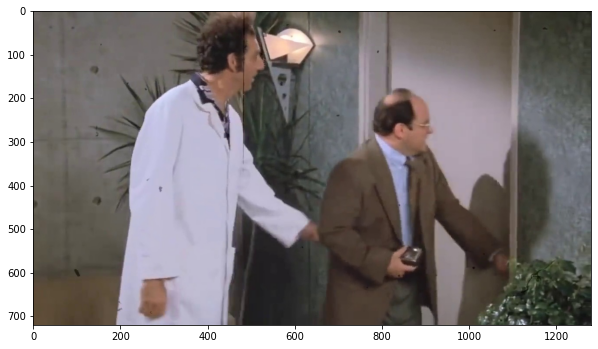

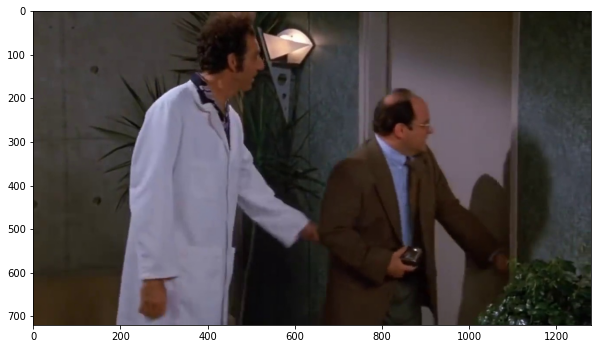

In [ ]:
file = random.choice(glob.glob('seinfeld/small-96/*.jpg'))
img = PIL.Image.open(file)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

file = file.replace('small-96', 'images')
img = PIL.Image.open(file)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

In [ ]:
#hide
import glob
list_file = glob.glob(str(path_hr)+'/*.*g')
len(list_file)

10014

The above shows what the crappy and normal images looked like now. Side note: this is a great scene from seinfeld.

A quick check shows that we have a dataset of about `10014` files. Pretty good.



## Adjust Brightness and resize


In [ ]:
import glob
import PIL
from tqdm.notebook import tqdm

def adjust_brightness(img, factor = 0.8):

  enhancer = PIL.ImageEnhance.Brightness(img)
  img = enhancer.enhance(factor)
  return img

def resize_one(img, size):

    targ_sz = resize_to(img, size, use_min = True)
    img = img.resize(targ_sz, resample = PIL.Image.BILINEAR).convert('RGB')
    return img

path = '/content/seinfeld/small-96/*.*g'
files = glob.glob(path)
files = sorted(files, key = lambda x: int(os.path.basename(x).split('.')[0]))

for i in tqdm(range(len(files))):

  file = files[i]

  img = PIL.Image.open(file)

  # brightness
  # img = adjust_brightness(img)

  # resize img
  img = resize_one(img, size = img.size[0]//3)

  # delete file and save new image
  os.remove(file)
  img.save(file, quality=60)

# Neural Network

Let's make the most of those `10014` files by using transforms.

I added horizontal and vertical flips, zoom changes, lighting changes and rotation changes. With Fastai this is really easy to do.


In [ ]:
#hide
learn = None
gc.collect()

13832

In [ ]:
#hide
free = gpu_mem_get_free_no_cache()
print("{} MB of GPU RAM free".format(free))

10309 MB of GPU RAM free


In [ ]:
bs,size=64,128
# bs,size=8,480
arch = models.resnet34

src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [ ]:
#hide
tfms = get_transforms(do_flip=True, flip_vert=True, max_zoom = 1.1, max_lighting=0.2, max_rotate = 10)
# tfms = (zoom_crop(scale=(0.75,2), do_rand=True), rand_resize_crop(224), rotate(degrees=(-30,30), p=0.75)], [])
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmCoord (symmetric_warp), kwargs={'magnitude': (-0.2, 0.2)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10, 10)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (zoom), kwargs={'scale': (1.0, 1.1), 'row_pct': (0, 1), 'col_pct': (0, 1)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmLighting (brightness), kwargs={'change': (0.4, 0.6)}, p=0.75, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmLighting (contrast), kwargs={'scale': (0.8, 1.25)}, p=0.75, resolved={

In [ ]:
#hide
import PIL
import random

# def get_max_size_of_image():
#   img = PIL.Image.open(random.choice(glob.glob(str(path_hr/'*.*g'))))
#   return max(img.size[0], img.size[1])

def get_data(bs,size=None):

    if(size is None):
      data = (src.label_from_func(lambda x: path_hr/x.name)
            .transform(tfms, tfm_y=True)
            .databunch(bs=bs).normalize(imagenet_stats, do_y=True))
    else:
      data = (src.label_from_func(lambda x: path_hr/x.name)
            .transform(tfms,size=size, tfm_y=True)
            .databunch(bs=bs).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [ ]:
#hide
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#hide
data = get_data(bs,size)

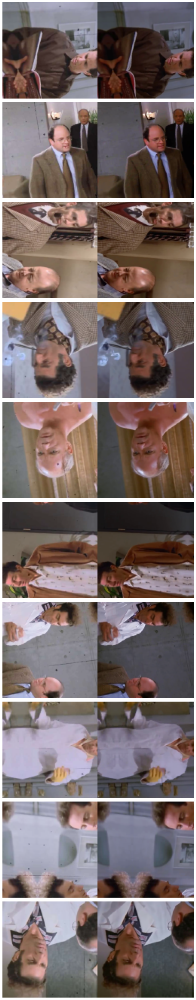

In [ ]:
#hide
data.show_batch(ds_type=DatasetType.Train, rows=10)

Here's some of the image transforms.

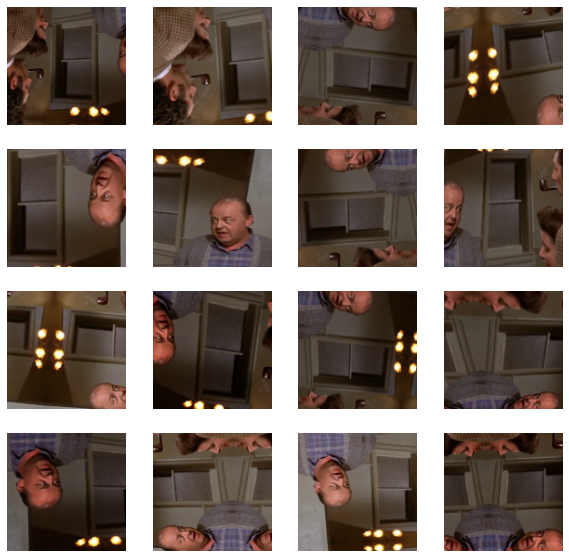

In [ ]:
def _plot(i,j,ax):
    x,y = data.train_ds[8]
    # print(x,y)
    x.show(ax, y=y)

plot_multi(_plot, 4, 4, figsize=(10,10))

Not bad! 

We'll use the [NoGAN network](https://www.fast.ai/2019/05/03/decrappify/) pioneered by fastai and jason antic on this data. This code was inspired by [lesson 7](https://github.com/fastai/course-v3/blob/master/nbs/dl1/lesson7-superres.ipynb) of the fastai course.

# Feature loss

In [ ]:
t = data.valid_ds[0][1].data
t = torch.stack([t,t])

def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [ ]:
gram_matrix(t)

tensor([[[0.0691, 0.0574, 0.0566],
         [0.0574, 0.0506, 0.0517],
         [0.0566, 0.0517, 0.0544]],

        [[0.0691, 0.0574, 0.0566],
         [0.0574, 0.0506, 0.0517],
         [0.0566, 0.0517, 0.0544]]])

In [ ]:
base_loss = F.l1_loss

vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [ ]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

In [ ]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()

In [ ]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

I trained the model on [google colab’s free gpus](https://colab.research.google.com/). They’re a great resource and I can’t believe they are free. 

# Training

The interesting thing that fastai [recommends](https://www.youtube.com/watch?v=9spwoDYwW_I) is increasing the size of your images gradually. 

So at first you train on small size images, then you upscale your images and retrain on the larger images. It saves you a lot of time. Pretty smart. 

First we'll train on images of size 128x128. Because the images are so small I can up the batch size to 64. 


In [ ]:
#hide
import shutil
def copy_to_drive():
  learn.export()
  model_path = learn.path/'export.pkl'
  !mkdir /content/drive/"My Drive"/video_restorer4
  # shutil.copyfile(model_path, '/content/drive/My Drive/seinfeld/export1.pkl')
  !cp $model_path /content/drive/"My Drive"/video_restorer4/


In [ ]:
data = get_data(bs=64,size=128)

In [ ]:
learn = None
gc.collect()
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,blur=True, norm_type=NormType.Weight)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


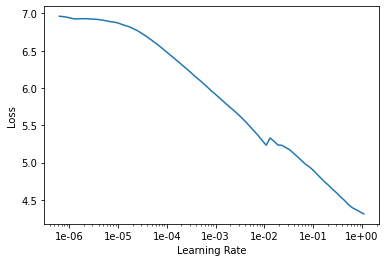

In [ ]:
learn.lr_find()
learn.recorder.plot()

Min numerical gradient: 9.12E-03
Min loss divided by 10: 1.10E-01


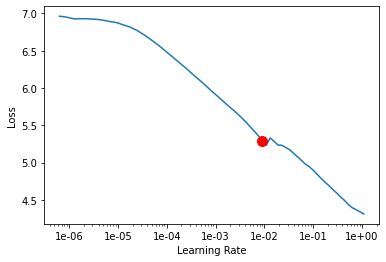

In [ ]:
learn.recorder.plot(suggestion=True)

I picked a learning rate of `1e-3` for this. I wanted something aggressive, but still on the safe side of explosion. This has been [shown](https://sgugger.github.io/how-do-you-find-a-good-learning-rate.html) to be very useful.

In [ ]:
lr = 1e-3

In [ ]:
#hide
def do_fit(save_name, lrs=slice(lr), pct_start=0.9, cycles = 10):
    learn.fit_one_cycle(cycles, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=2, imgsize=7)





![alt text](/images/star_wars/first_train.png)



epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.977846,1.288543,0.100462,0.126738,0.154427,0.050958,0.234276,0.533892,0.087789,06:55
1,1.373972,1.134356,0.091954,0.115998,0.138492,0.045263,0.195335,0.469765,0.077548,07:03
2,1.275192,1.110874,0.088513,0.115751,0.133076,0.042544,0.200189,0.456550,0.074251,06:55
3,1.170492,0.999270,0.086587,0.106609,0.117754,0.037856,0.174057,0.408015,0.068393,06:50
4,1.153695,1.052756,0.088513,0.108520,0.121917,0.039482,0.191337,0.431678,0.071309,06:48
5,1.145099,1.004814,0.089638,0.105387,0.117073,0.037623,0.178247,0.408966,0.067881,06:47
6,1.135447,0.995385,0.081484,0.104492,0.115914,0.037516,0.178947,0.409000,0.068033,06:46
7,1.119632,1.045322,0.098631,0.107274,0.119542,0.038633,0.188341,0.423399,0.069502,06:49
8,1.104967,1.063058,0.104515,0.109682,0.122539,0.039742,0.187247,0.428007,0.071325,06:57
9,1.045641,0.920453,0.077871,0.100881,0.109290,0.034760,0.156918,0.377589,0.063144,06:35


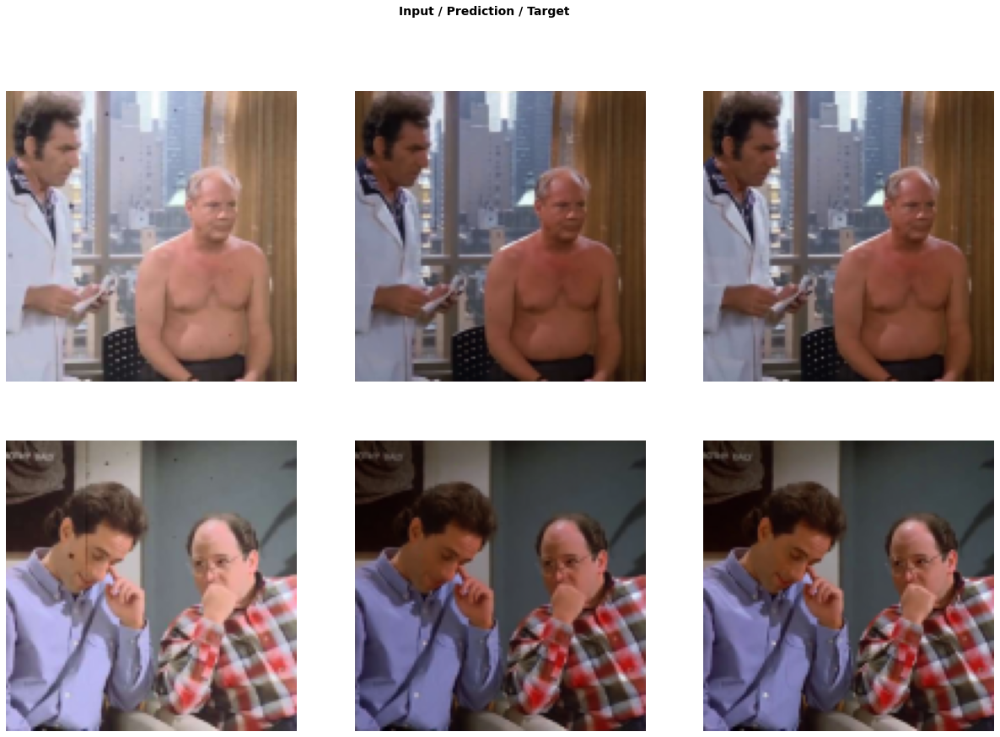

In [ ]:
do_fit('1a', lrs = slice(lr*10))

The network will print the results during training. The input is on the left, the prediction in the middle and the target on the right. The results look very promising!

In [ ]:
#hide
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.023538,0.919067,0.078222,0.100836,0.109090,0.034669,0.156371,0.376867,0.063010,06:33
1,1.021746,0.917143,0.077887,0.100678,0.108873,0.034619,0.155953,0.376173,0.062959,06:31
2,1.018076,0.918258,0.078786,0.100896,0.108897,0.034556,0.156026,0.376269,0.062828,06:31
3,1.017849,0.914476,0.077302,0.100660,0.108540,0.034567,0.155445,0.374969,0.062995,06:33
4,1.011995,0.912450,0.078923,0.099955,0.107956,0.034370,0.155094,0.373498,0.062655,06:43
5,1.008831,0.910169,0.076934,0.099769,0.107866,0.034346,0.155085,0.373706,0.062464,06:47
6,1.004403,0.908919,0.076326,0.099945,0.107865,0.034276,0.155255,0.372944,0.062308,06:50
7,1.000598,0.905723,0.076353,0.100013,0.107572,0.034150,0.153919,0.371411,0.062307,06:49
8,0.996796,0.902989,0.075896,0.099317,0.107105,0.034052,0.153946,0.370675,0.061997,06:44
9,0.989987,0.892806,0.073567,0.098672,0.106214,0.033726,0.152036,0.367145,0.061448,06:36


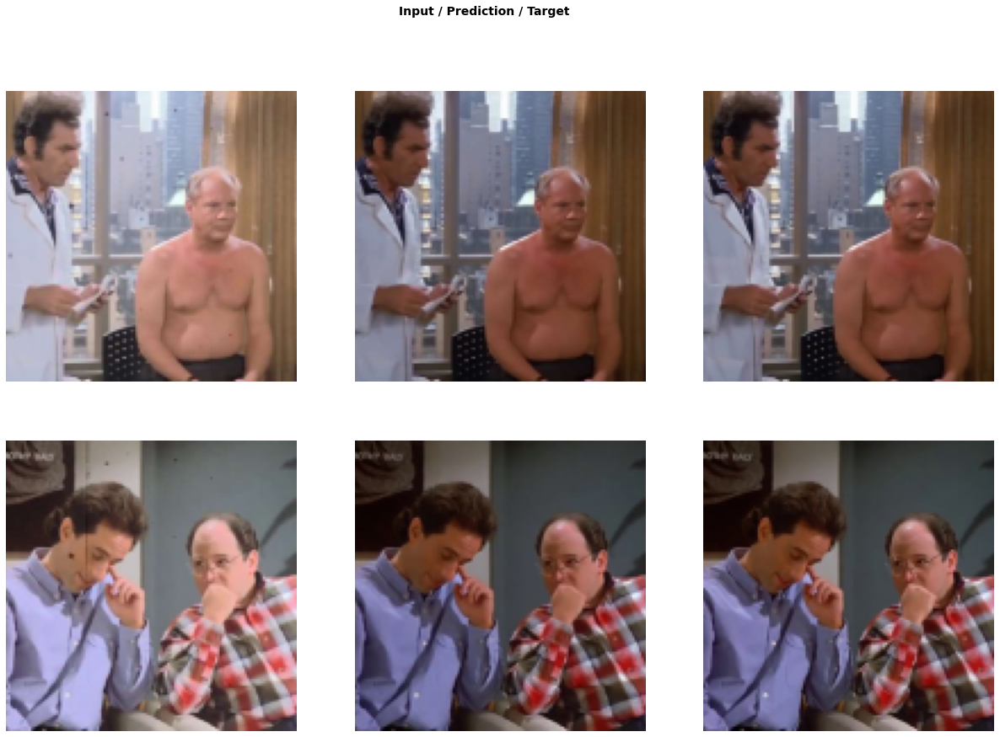

In [ ]:
#hide
do_fit('1b', slice(lr))

In [ ]:
#hide
copy_to_drive()

I resize and train again. And again. Every time I make the resize slightly larger than it was previously. I moved from 128x128 to 480x480 to the original size of the video frames. 

# Upscale

In [ ]:
data = get_data(bs=3, size=480)

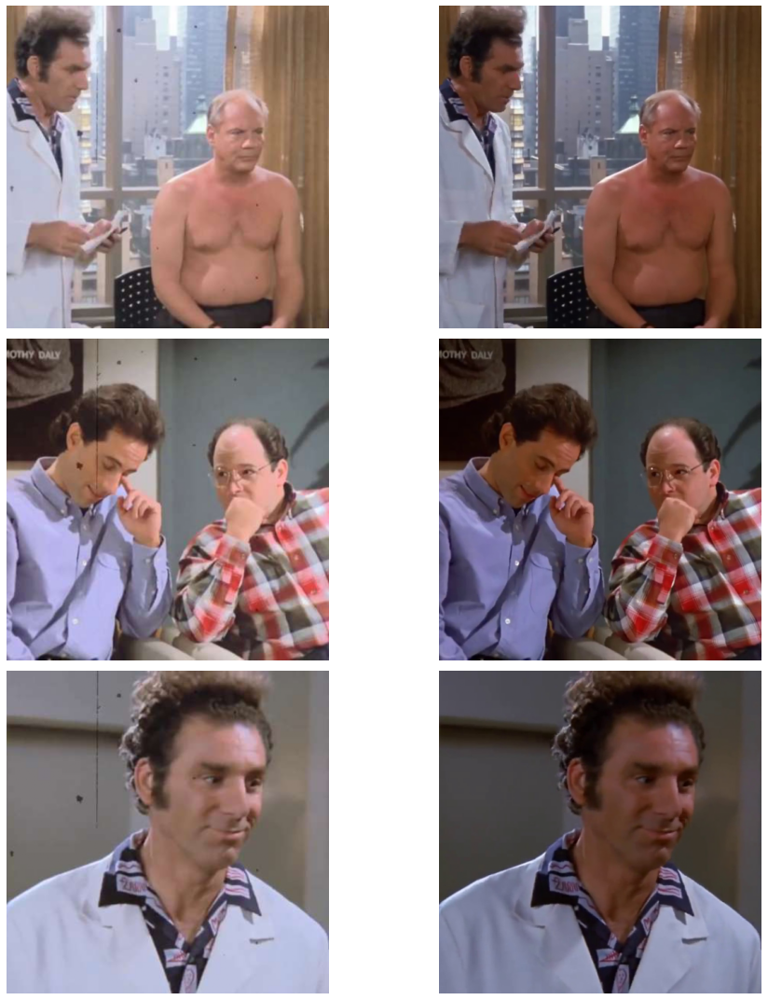

In [ ]:
data.show_batch(ds_type=DatasetType.Valid, rows=10, figsize=(15,15))

In [ ]:
learn.data = data
learn.freeze()
gc.collect()

140

In [ ]:
#hide_output
learn.load('1b')

Learner(data=ImageDataBunch;

Train: LabelList (9013 items)
x: ImageImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
y: ImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
Path: seinfeld/small-96;

Valid: LabelList (1001 items)
x: ImageImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
y: ImageList
Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480),Image (3, 480, 480)
Path: seinfeld/small-96;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
  

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


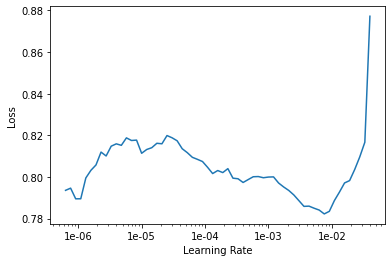

In [ ]:
#hide
learn.lr_find()
learn.recorder.plot()

Min numerical gradient: 8.32E-06
Min loss divided by 10: 7.59E-04


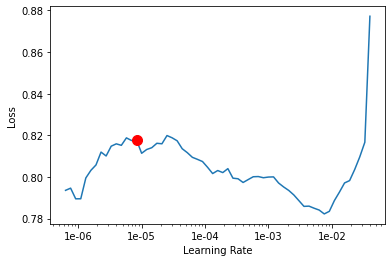

In [ ]:
#hide
learn.recorder.plot(suggestion=True)

In [ ]:
lr = 1e-5

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.633410,0.573938,0.049370,0.137653,0.133030,0.035734,0.072268,0.118860,0.027023,23:42
1,0.624346,0.560392,0.049209,0.136090,0.130341,0.034740,0.068059,0.115558,0.026395,23:44
2,0.615855,0.555409,0.052091,0.134573,0.128542,0.034246,0.066202,0.113728,0.026025,23:52
3,0.611041,0.554625,0.054226,0.134497,0.127752,0.033969,0.065906,0.112495,0.025779,23:52
4,0.603554,0.558545,0.062742,0.134454,0.127427,0.034019,0.062491,0.111604,0.025807,23:42
5,0.599067,0.546702,0.052955,0.132594,0.125886,0.033501,0.065170,0.111157,0.025437,23:47
6,0.588811,0.541868,0.052602,0.131561,0.124768,0.032944,0.064760,0.110183,0.025050,23:51
7,0.587821,0.531380,0.045570,0.131277,0.124333,0.032941,0.063078,0.109253,0.024929,23:48
8,0.592638,0.537813,0.053106,0.131856,0.124519,0.032886,0.061937,0.108624,0.024885,23:43
9,0.563234,0.527484,0.052128,0.130299,0.122642,0.032429,0.058917,0.106512,0.024558,23:30


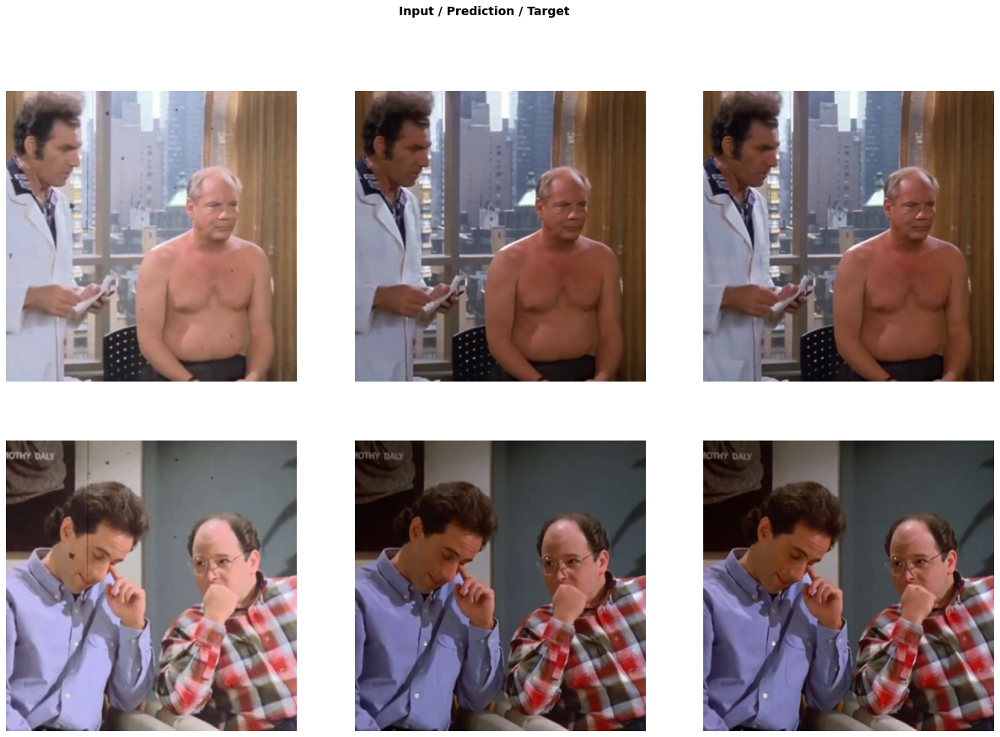

In [ ]:
do_fit('2a', lrs=slice(lr, 1e-3))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.567495,0.535786,0.058801,0.130635,0.123006,0.032546,0.059234,0.106916,0.024647,23:27
1,0.566914,0.530164,0.054634,0.130409,0.122741,0.032442,0.058840,0.106530,0.024568,23:27
2,0.562061,0.528548,0.053312,0.130272,0.122608,0.032391,0.058983,0.106452,0.024530,23:29
3,0.566576,0.527613,0.052468,0.130420,0.122708,0.032413,0.058602,0.106464,0.024537,23:29
4,0.555326,0.526411,0.051601,0.130249,0.122560,0.032386,0.058691,0.106398,0.024526,23:29
5,0.569071,0.524213,0.049775,0.130321,0.122530,0.032352,0.058437,0.106305,0.024493,23:29
6,0.562020,0.522922,0.048748,0.130281,0.122441,0.032333,0.058350,0.106279,0.024490,23:32
7,0.563853,0.524678,0.050087,0.130147,0.122388,0.032327,0.058921,0.106324,0.024485,23:30
8,0.553681,0.524489,0.049933,0.130288,0.122492,0.032352,0.058560,0.106367,0.024497,23:29
9,0.567242,0.527172,0.052604,0.130301,0.122542,0.032396,0.058505,0.106292,0.024532,23:30


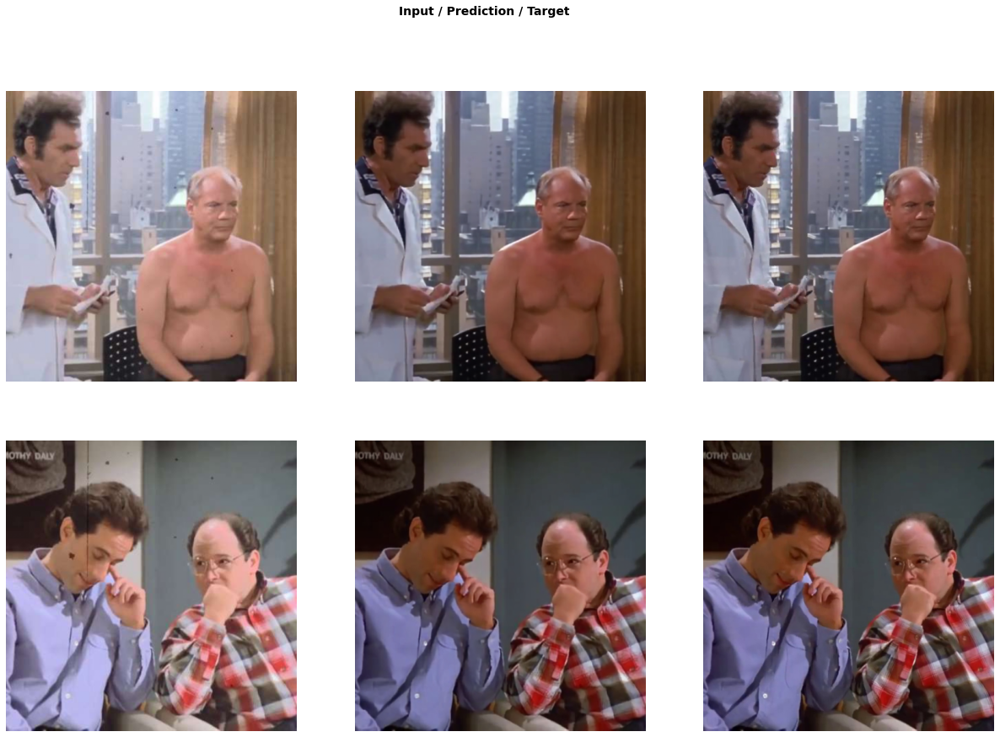

In [ ]:
#hide
do_fit('2b')

In [ ]:
#hide
copy_to_drive()

mkdir: cannot create directory ‘/content/drive/My Drive/video_restorer4’: File exists


# Final Upscale

In [ ]:
#hide
data = get_data(bs=1)

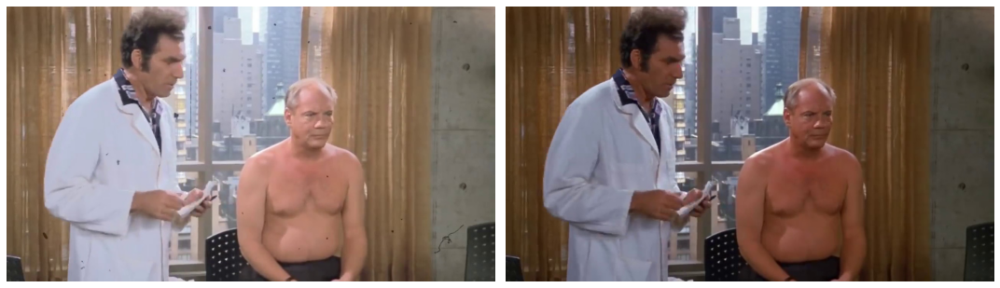

In [ ]:
#hide
data.show_batch(ds_type=DatasetType.Valid, rows=2, figsize=(15,15))

In [ ]:
#hide
learn.data = data
learn.freeze()
gc.collect()

10011

In [ ]:
#hide
learn.load('2b')

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


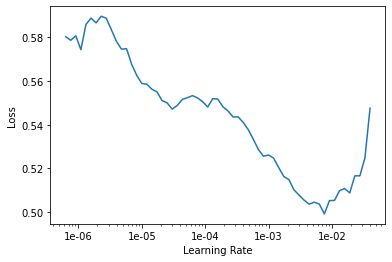

In [ ]:
#hide
learn.lr_find()
learn.recorder.plot()

Min numerical gradient: 6.92E-06
Min loss divided by 10: 7.59E-04


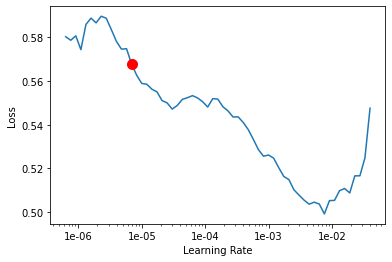

In [ ]:
#hide
learn.recorder.plot(suggestion=True)

In [ ]:
#hide
lr = 1e-6

In [ ]:
#hide
do_fit('3a', slice(lr, 1e-3), cycles = 2)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.584978,0.550321,0.071050,0.130416,0.117658,0.027511,0.110803,0.078932,0.013951,1:28:54


Buffered data was truncated after reaching the output size limit.

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,0.571975,0.549917,0.070227,0.130422,0.117595,0.027432,0.111543,0.078827,0.013871,1:30:08
1,0.614925,0.552621,0.072550,0.130627,0.117971,0.027576,0.110494,0.079431,0.013971,1:30:09


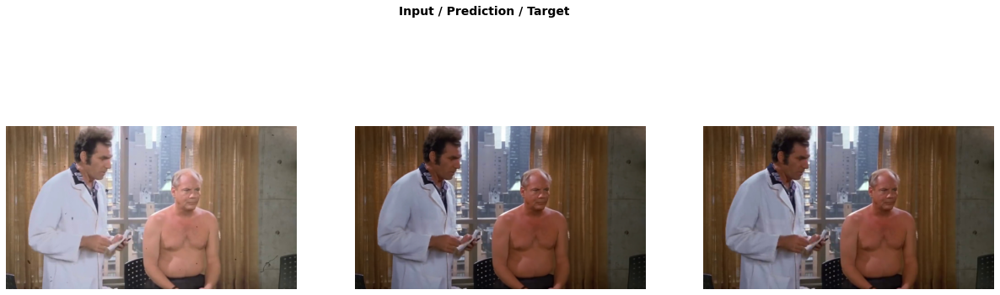

In [ ]:
#hide
do_fit('3b', slice(lr, 1e-3), pct_start=0.3, cycles = 2)
# do_fit('3b', slice(1e-3, 1e-4), pct_start=0.3, cycles = 2)

In [ ]:
#hide
copy_to_drive()

mkdir: cannot create directory ‘/content/drive/My Drive/video_restorer4’: File exists
cp: cannot stat '/content/drive/My': No such file or directory
cp: cannot stat 'Drive/video_restorer4/export.pkl': No such file or directory



# Inference: Applying to Star Wars

Once this network had trained, I ran inference. This was more involved than I originally thought. 

I had to download the Star Wars deleted scenes (using [youtube-dl](https://github.com/ytdl-org/youtube-dl)) and then extract all the frames in this video. I extracted the frames using the same method previously. 

![alt text](/images/star_wars/star_wars_frame.png) 


Then I had to run inference from the learner on each individual frame of the video. That takes a long time. 

In [ ]:
# learn = load_learner("/content/drive/My Drive/video_restorer/")
# learn = load_learner("/content/drive/My Drive/video_restorer3/")
learn = load_learner("/content/drive/My Drive/video_restorer4/")

def run_inference_images(file, dest):

  img = open_image(file)
  p,img_hr,b = learn.predict(img)

  # Image(img_hr).save(dest)
  # plt.figure(figsize=(25,25))
  Image(img_hr).show(figsize=(25,25))
  plt.savefig(dest, bbox_inches = 'tight', pad_inches = 0)
  plt.close()

def scale_to_square(orig, targ, dest):
  # a simple stretch to fit a square really makes a big difference in rendering quality/consistency.
  # I've tried padding to the square as well (reflect, symetric, constant, etc).  Not as good!
  targ_sz = (targ, targ)
  orig = orig.resize(targ_sz, resample=PIL.Image.BILINEAR)
  orig.save(dest)
  return dest

def unsquare(image, orig, dest):
  targ_sz = orig.size
  image = image.resize(targ_sz, resample=PIL.Image.BILINEAR)
  image.save(dest)
  return dest


def adjust_brightness(img, factor, dest):

  enhancer = PIL.ImageEnhance.Brightness(img)
  img = enhancer.enhance(factor)
  os.remove(dest)
  img.save(dest)
  return img


I added some hacks here. 

First, I added a render factor. This was taken from [Deoldify](https://github.com/jantic/DeOldify). The idea is that I downscale the image and convert it to a square. Then I run inference on that image. The model is more receptive to images that are square shaped. This has been [shown](https://github.com/jantic/DeOldify#stuff-that-should-probably-be-in-a-paper) to reduce 'glitches' considerably. 

After running inference on the square shaped image I convert it back to its original shape. I found this to reduce glitches and generally result in a smoother video output. I set the `render_factor` to `40`, although it can be higher if we want higher res output. I may need a larger RAM for that though. 

Second, I adjust brightness. This isn't really a hack. Seems like more of a mistake that I'm correctly manually. For some reason the model inference results in images that are very low in brightness. 

I suspect it's something to with the `softlight` filter we used for ffmpeg earlier. But I'm having to manually correct that here. I'll need to look into this further.  

Third, I'm using matplotlib's save functionality. I found fastai's [save image](https://docs.fast.ai/vision.image.html#Image.save) functionality to give me very weird results (luke clothes were fluroscent blue and red). But strangely matplotlib's save functionality gives me okay results. I'll need to look into this. I suspect that I may be loosing quality on the image because I'm using matplotlib's `savefig` functionality. 

In [ ]:
import PIL
import glob
import os
from tqdm.notebook import tqdm

render_factor = 40

if os.path.exists('imagepaths.txt'):
  os.remove('imagepaths.txt')

!rm -Rf seinfeld_inference/high_res/
!mkdir seinfeld_inference/high_res/

def write_to_txt(dest):
  file = open("imagepaths.txt", "a") 
  write = "file '" + dest.strip() + "'" + "\n"
  file.write(write) 
  file.close() 

files = sorted(glob.glob('seinfeld_inference/images/*.*g'), key = lambda x: int(os.path.basename(x).split('.')[0]))
files = files[300:]

for i in tqdm(range(1000)):

  # file = random.choice(files)
  file = files[i]
  dest = 'seinfeld_inference/high_res/'+os.path.basename(file)

  # scale to square
  new_path = scale_to_square(PIL.Image.open(file), render_factor*16, dest = dest.split('.')[0]+'_square.jpg')

  # run inference
  run_inference_images(new_path, dest)

  # unsquare
  dest = unsquare(PIL.Image.open(dest), PIL.Image.open(file), dest = dest.split('.')[0]+'_unsquared.jpg')

  # write to txt
  write_to_txt(dest)

  # increase brightness
  adjust_brightness(PIL.Image.open(dest),factor = 1.75, dest=dest)


Here's some of the outputs from the model.

![alt text](/images/star_wars/model_inference.png) 
![alt text](/images/star_wars/model_inference2.png)
![alt text](/images/star_wars/model_inference3.png)


Then I had to stitch all these frames together to create a video. To do that I initially used ffmpeg but I ended up overloading my RAM. Instead I used opencv2's `VideoWriter`.


In [ ]:
import cv2
import numpy as np
import os

clean = 'seinfeld_inference.mp4'
cap = cv2.VideoCapture(clean)
clean_fps = cap.get(cv2.CAP_PROP_FPS)
print(clean_fps)

pathOut = 'video.mp4'
try:
  os.remove(pathOut)
except:
  pass

fps = clean_fps
frame_array = []

files = sorted(glob.glob('seinfeld_inference/high_res/*_unsquared.*g'), key = lambda x: int(os.path.basename(x).split('.')[0].split('_')[0]))
print(len(files))

for i in range(len(files)):
	filename=files[i]
	# reading each files
	img = cv2.imread(filename)
	height, width, layers = img.shape
	size = (width,height)
	
	# inserting the frames into an image array
	frame_array.append(img)
out = cv2.VideoWriter(pathOut,cv2.VideoWriter_fourcc(*'MP4V'), fps, size)
for i in range(len(frame_array)):
	# writing to a image array
	out.write(frame_array[i])
out.release()

Here is the final output.

{% include youtubePlayer.html id="2BcoLsuJMP0" %}

And the original video

{% include youtubePlayer.html id="f00IkrWvur4?start=159" %}



# Improvements

1) As you can see there is room for improvement. The sky needs a bit more work. But I like the vibrancy of the background. That is an interesting (and completely unplanned) effect. The goal was to remove the ‘cue marks’ (annoying black specs) from the video. I think its done okay in that respect - but there's still more to do.

I like how the network has intensified the sun though. It completely changes the the scene between Luke and Biggs when Biggs says he's joining the rebellion. 

![alt text](/images/star_wars/a_new_sun.png)
![alt text](/images/star_wars/no_sun.png) 

2) There's a weird horizontal bar line that shows up around the ``22`` second mark. I didn't add any horizontal bars in the training set so it's completely understandable that the network didn't remove that at all. But in the future I'll need to add more horizontal bars to my training set to fix these.  


3) I’m also thinking of doing more super-resolution on the video. It would be nice to show a young Luke Skywalker in high quality. To do that I could resize the images before training further. I've already downscaled the image, but potentially I could downscale it further. 

Alternatively, to achieve superres I could potentially use a ready-made upscaler such as [VapourSynth](https://github.com/AlphaAtlas/VapourSynth-Super-Resolution-Helper). This is probably the best option as the original video is already in poor quality.

4) Inference is also an issue. It tends to overload memory and crash. The result is that `42` seconds is the longest I could get for this video. I'm not completely sure how to solve this problem. But I'll need to solve it if I'm going to be using this further.

So much to do!


